In [52]:
import networkx as nx
from networkx.algorithms.approximation import clique
import pandas as pd
import seaborn as sns
import warnings
import requests
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import numpy as np
import collections
from collections import defaultdict
from itertools import combinations
import scipy.sparse.linalg
warnings.filterwarnings('ignore')


In [53]:
%matplotlib inline 

In [54]:
data = pd.read_csv("C:/Users/MrWhi/OneDrive/Desktop/univpm/DataScience/Progetto_Datascience/NetworkxProg/tvshow_edges.csv")

In [55]:
data.head()

,node_1,node_2
0,0,1838
1,0,1744
2,0,14
3,0,2543
4,1,1009


In [56]:
data.shape

(17262, 2)

In [57]:
data.describe()

,node_1,node_2
count,17262.000000,17262.000000
mean,1409.634573,2455.667188
std,1017.145921,957.429066
min,0.000000,8.000000
25%,528.000000,1757.000000
50%,1206.000000,2584.000000
75%,2150.000000,3254.000000
max,3888.000000,3891.000000


In [98]:
# Visualizza i primi 10 nodi del grafo
print("Primi 10 nodi del grafo:")
print(list(graph.nodes)[:10])

# Visualizza tutti i nodi del grafo (se sono pochi)
print("Tutti i nodi del grafo:")
print(list(graph.nodes))


Primi 10 nodi del grafo:
[0, 1838, 1744, 14, 2543, 1, 1009, 1171, 1465, 2069]
Tutti i nodi del grafo:
[0, 1838, 1744, 14, 2543, 1, 1009, 1171, 1465, 2069, 2080, 1856, 3799, 1033, 2717, 300, 1603, 942, 3678, 952, 815, 2, 3656, 3459, 1157, 1993, 3, 386, 2659, 2160, 1925, 3511, 372, 1506, 2303, 1634, 1706, 3038, 749, 2790, 452, 1936, 2915, 2972, 1100, 2918, 3026, 2406, 1673, 11, 3156, 2250, 2350, 1050, 1060, 1457, 3054, 72, 1553, 1114, 3525, 2064, 3791, 1595, 1177, 1596, 2935, 545, 1840, 423, 1788, 2890, 603, 1498, 703, 1073, 1422, 3283, 2590, 3431, 354, 1720, 3291, 2773, 2804, 2476, 2036, 46, 1986, 2588, 3507, 566, 4, 667, 1931, 5, 275, 1874, 3832, 2847, 1929, 3237, 1209, 578, 3852, 1452, 2361, 590, 2005, 77, 3409, 2816, 80, 2454, 1119, 771, 3204, 2201, 2764, 1609, 315, 3550, 1193, 2344, 1370, 2593, 2472, 3221, 3062, 3747, 3082, 2713, 911, 6, 556, 2524, 3839, 2355, 7, 2170, 495, 3189, 2109, 1920, 1961, 3651, 2179, 3339, 938, 48, 2549, 3122, 2984, 3870, 908, 2449, 3143, 965, 229, 1729, 35

In [58]:
# Crea un grafo vuoto
Graphtype = nx.Graph()

# Crea il grafo da un DataFrame utilizzando le colonne 'node_1' e 'node_2'
graph = nx.from_pandas_edgelist(data, source='node_1', target='node_2', create_using=Graphtype)

In [59]:
# Rimuovi tutti i self-loops
graph.remove_edges_from(nx.selfloop_edges(graph))


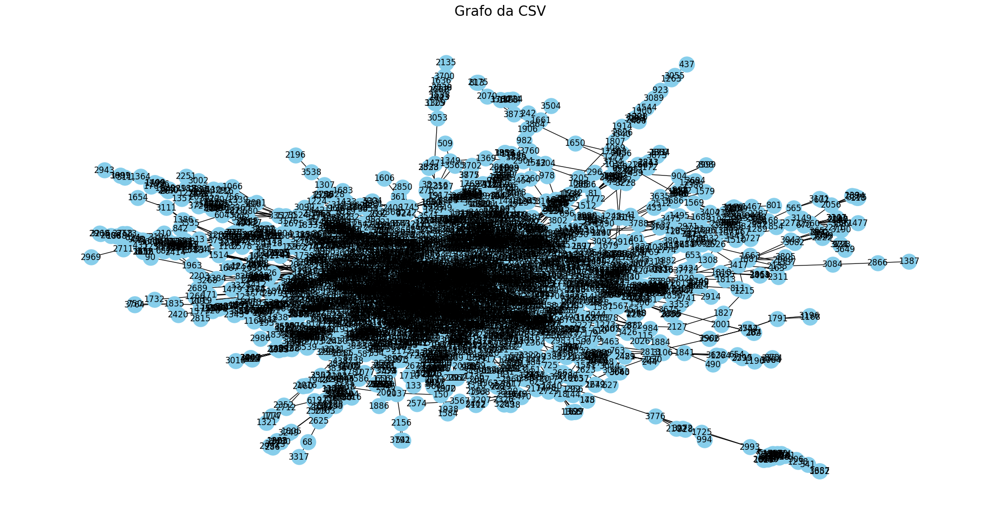

In [60]:
# Layout per il grafo
pos = nx.spring_layout(graph)

# Visualizzazione del grafo
plt.figure(figsize=(20, 10))
nx.draw(graph, pos, with_labels=True, node_size=500, node_color='skyblue', font_size=12)
plt.title("Grafo da CSV", fontsize=20)
plt.show()

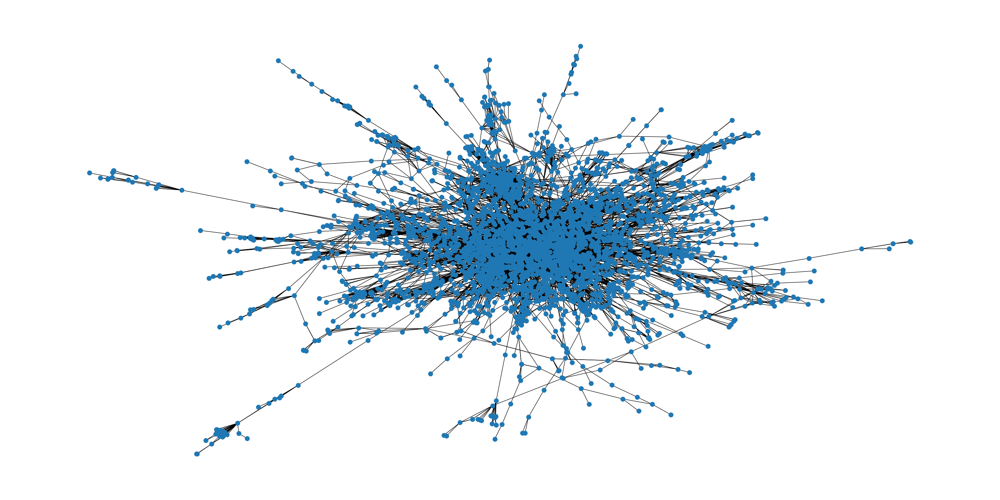

In [61]:
# Plot del grafo con spring layout
plt.figure(figsize=(40,20))
pos = nx.spring_layout(graph)
nx.draw_networkx(graph, pos, with_labels=False, node_size=100)
plt.axis('off')
plt.show()

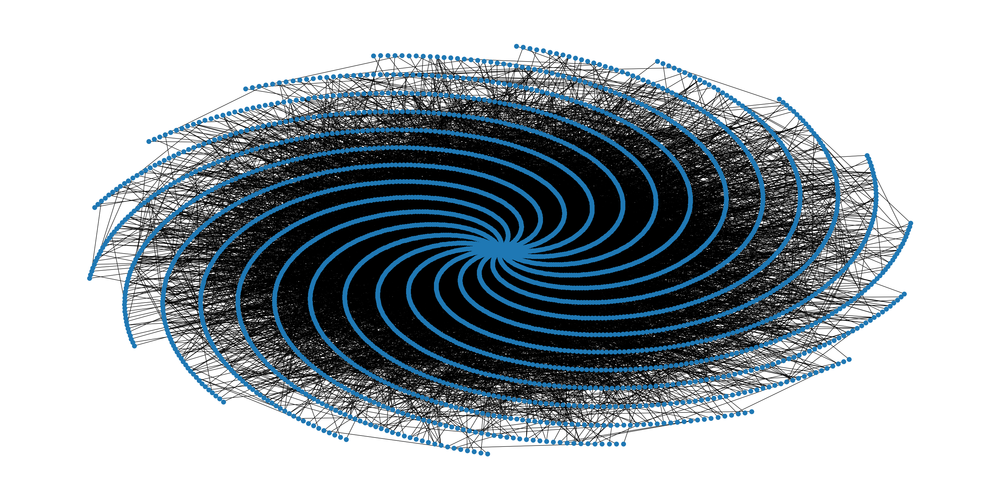

In [62]:
# Plot del grafo con spiral layout
plt.figure(figsize=(40,20))
pos = nx.spiral_layout(graph)
nx.draw_networkx(graph, pos, with_labels=False, node_size=100)
plt.axis('off')
plt.show()

In [63]:
print("NODES: ", len(graph.nodes))
print("EDGES: ", len(graph.edges))
print("RAGGIO: ", nx.radius(graph))
print("DIAMETRO: ", nx.diameter(graph))
print("DENSITY: ", nx.density(graph))
print("IS_CONNECTED: ", nx.is_connected(graph))
print("CLUSTERING: ", nx.average_clustering(graph))
print("N. OF CYCLE: ",len(nx.cycle_basis(graph)))

NODES:  3892
EDGES:  17239
RAGGIO:  11
DIAMETRO:  20
DENSITY:  0.0022767115088631815
IS_CONNECTED:  True
CLUSTERING:  0.37373843245973964
N. OF CYCLE:  13348


In [64]:
grado = dict(graph.degree())
gradi = list(grado.values())
nodes = list(graph.nodes)
densita = nx.density(graph)
cluster = nx.clustering(graph)

print('Standard deviation: {}'.format(np.std(gradi)))
print('Mean: {}'.format(np.mean(gradi)))
print('Median: {}'.format(np.median(gradi)))
print('Min: {}'.format(np.min(gradi)))
print('Max: {}'.format(np.max(gradi)))
print("Assortativity coefficient: " + str(nx.degree_assortativity_coefficient(graph)))

Standard deviation: 12.557619271333127
Mean: 8.85868448098664
Median: 5.0
Min: 1
Max: 126
Assortativity coefficient: 0.5605396504711333


Nodo con la centralità di grado più alta: 2008, Valore: 0.03238242097147263


<BarContainer object of 3892 artists>

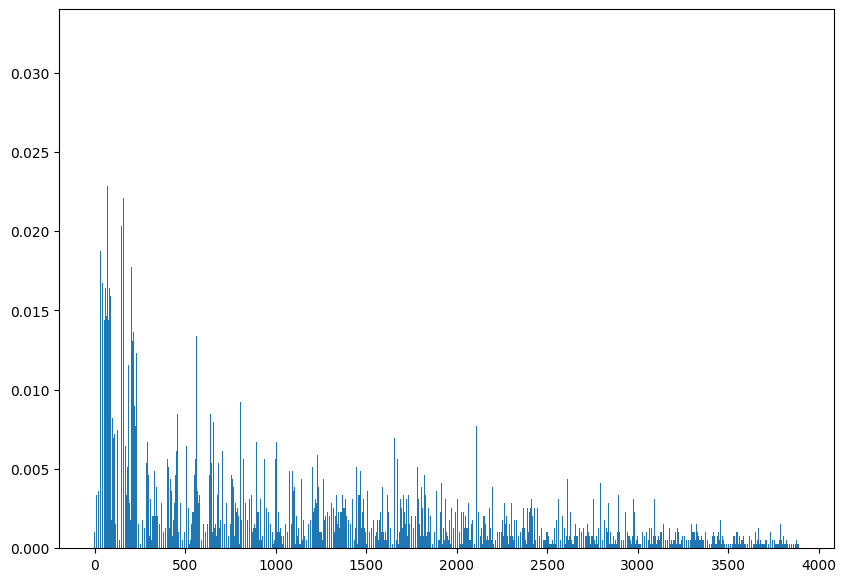

In [65]:
graph_degree = nx.degree_centrality(graph)

# Trova il nodo con la centralità di grado più alta e il suo valore

max_node, max_degree = max(graph_degree.items(), key=lambda x: x[1])
print(f"Nodo con la centralità di grado più alta: {max_node}, Valore: {max_degree}")

# Plot della distribuzione di tutte le centralità di grado
x_degree = graph_degree.values()
y_degree = graph_degree.values()
plt.figure(figsize=(10,7))
plt.bar(range(len(x_degree)), y_degree)



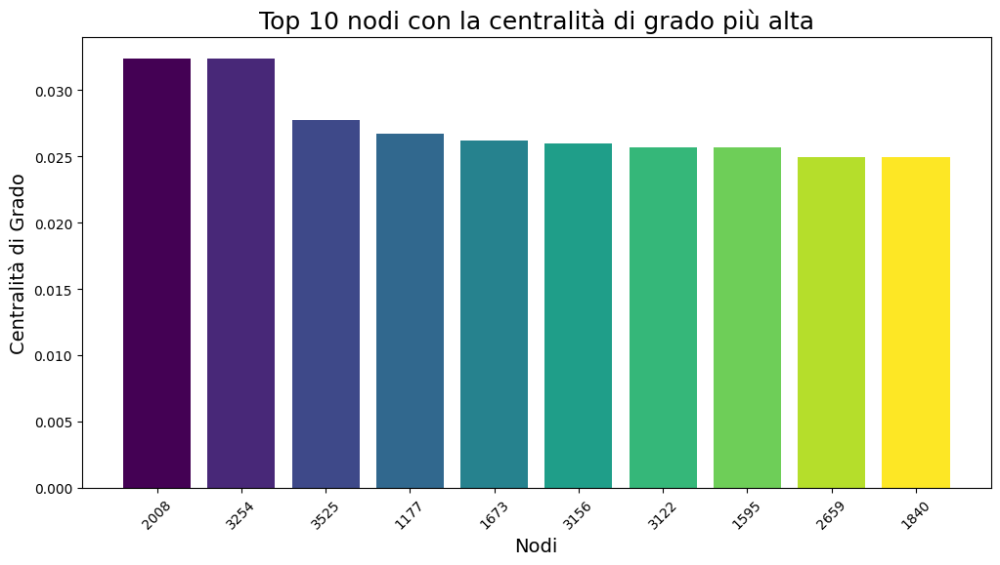

In [66]:


# Supponiamo che il grafo G1 sia già definito
# Calcolo della centralità di grado
graph_degree = nx.degree_centrality(graph)

# Creazione del DataFrame con i nodi e le loro centralità di grado
degree_df = pd.DataFrame(graph_degree.items(), columns=['nodes', 'degree_centrality'])

# Selezione dei top 10 nodi con la centralità di grado più alta
top_10_degree = degree_df.sort_values(by='degree_centrality', ascending=False).head(10)

# Visualizzazione dei top 10 nodi
plt.figure(figsize=(12, 6))
colors = plt.cm.viridis(np.linspace(0, 1, 10))  # Creazione di una lista di colori unici per i top 10 nodi
bars = plt.bar(top_10_degree['nodes'].astype(str), top_10_degree['degree_centrality'], color=colors)
plt.xlabel('Nodi', fontsize=14)
plt.ylabel('Centralità di Grado', fontsize=14)
plt.title('Top 10 nodi con la centralità di grado più alta', fontsize=18)
plt.xticks(rotation=45)

plt.show()


In [67]:
def draw(graph, pos, measures, measure_name):
    plt.figure(figsize=(40, 18), facecolor='#e8f4f8')
    
    # Disegna i nodi con colorazioni basate sulle misure
    nodes = nx.draw_networkx_nodes(graph, pos, node_size=500, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys(), 
                                   edgecolors='k', linewidths=1.5)
    
    # Disegna gli archi con stile personalizzato
    edges = nx.draw_networkx_edges(graph, pos, edge_color='gray', style='dashed', alpha=0.5)
    
    
    
    # Aggiungi la barra dei colori e il titolo
    plt.colorbar(nodes, label='Centralità di Grado')
    plt.title(measure_name, fontsize=20, fontweight='bold')
    
    plt.axis('off')
    plt.show()


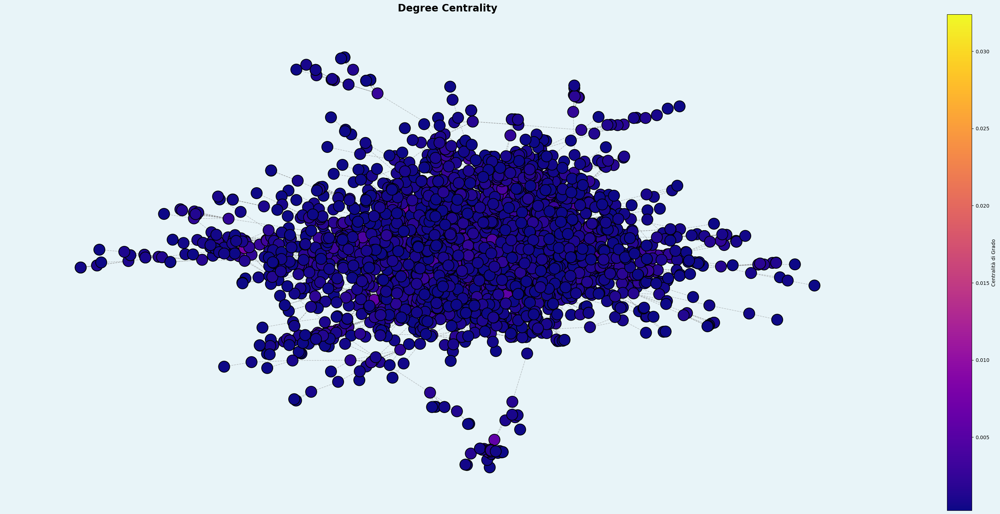

In [68]:
# Supponiamo che il grafo 'graph' sia già definito # Calcolo della centralità di grado 
d = nx.degree_centrality(graph)
# Plot del grafo con la centralità di grado
pos = nx.spring_layout(graph)
draw(graph, pos, d, 'Degree Centrality')


In [69]:
def draw(graph, pos, measures, measure_name):
    plt.figure(figsize=(45, 18), facecolor='#e8f4f8')
    
    # Disegna i nodi con colorazioni basate sulle misure
    nodes = nx.draw_networkx_nodes(graph, pos, node_size=500, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys(), 
                                   edgecolors='k', linewidths=1.5)
    
    # Disegna gli archi con stile personalizzato
    edges = nx.draw_networkx_edges(graph, pos, edge_color='gray', style='dashed', alpha=0.5)
    
    
    # Aggiungi la barra dei colori e il titolo
    plt.colorbar(nodes, label='Centralità di Prossimità')
    plt.title(measure_name, fontsize=20, fontweight='bold')
    
    plt.axis('off')
    plt.show()


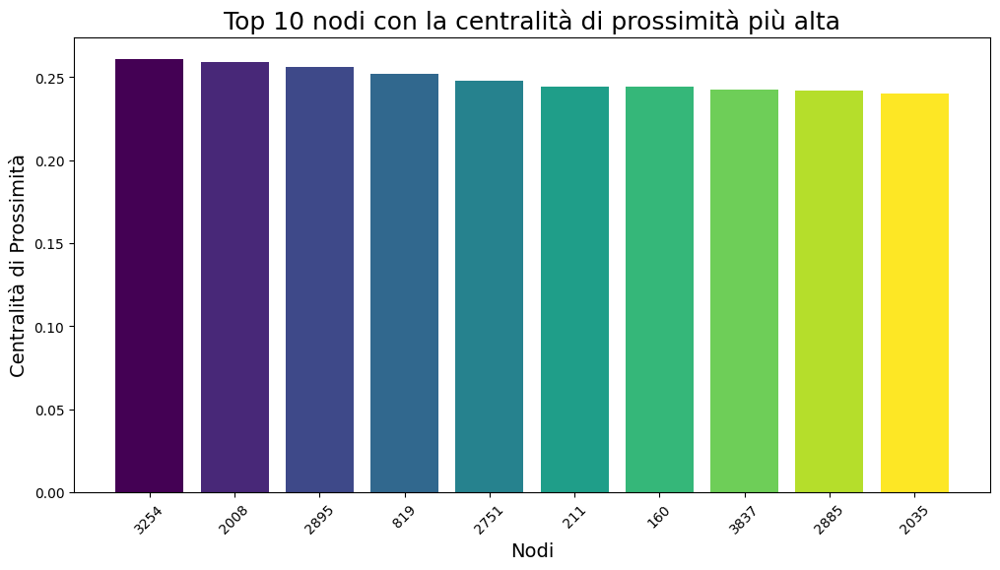

In [70]:


# Supponiamo che il grafo G1 sia già definito
# Calcolo della centralità di prossimità
graph_closeness = nx.closeness_centrality(graph)

# Creazione del DataFrame con i nodi e le loro centralità di prossimità
closeness_df = pd.DataFrame(graph_closeness.items(), columns=['nodes', 'closeness_centrality'])

# Selezione dei top 10 nodi con la centralità di prossimità più alta
top_10_closeness = closeness_df.sort_values(by='closeness_centrality', ascending=False).head(10)

# Visualizzazione dei top 10 nodi
plt.figure(figsize=(12, 6))
colors = plt.cm.viridis(np.linspace(0, 1, 10))  # Creazione di una lista di colori unici per i top 10 nodi
bars = plt.bar(top_10_closeness['nodes'].astype(str), top_10_closeness['closeness_centrality'], color=colors)
plt.xlabel('Nodi', fontsize=14)
plt.ylabel('Centralità di Prossimità', fontsize=14)
plt.title('Top 10 nodi con la centralità di prossimità più alta', fontsize=18)
plt.xticks(rotation=45)

plt.show()


Nodo con la centralità di prossimità più alta: 3254, Valore: 0.2609832986786505


<BarContainer object of 3892 artists>

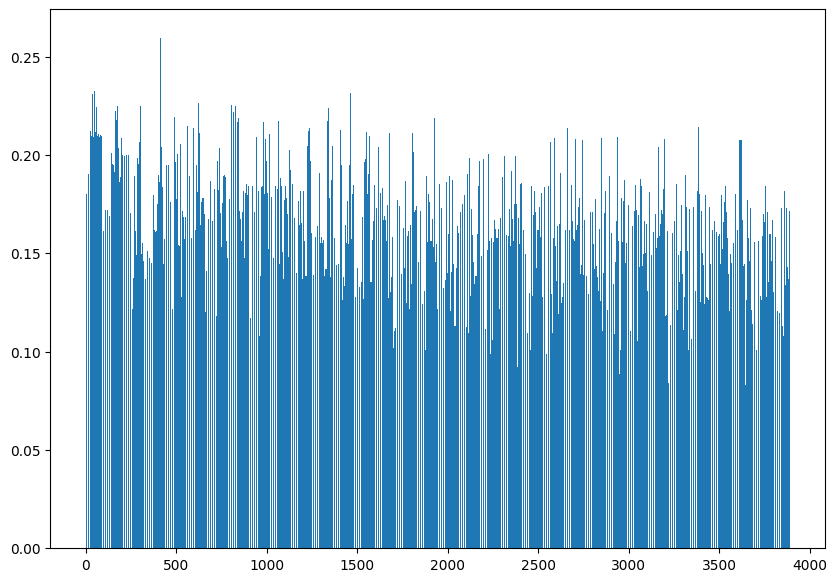

In [71]:

# Calcolo della centralità di prossimità
graph_closeness = nx.closeness_centrality(graph)

# Trova il nodo con la centralità di prossimità più alta e il suo valore
max_node, max_closeness = max(graph_closeness.items(), key=lambda x: x[1])
print(f"Nodo con la centralità di prossimità più alta: {max_node}, Valore: {max_closeness}")

# Plot della distribuzione di tutte le centralità di prossimità
x_closeness = graph_closeness.values()

y_closeness = graph_closeness.values()
plt.figure(figsize=(10,7))
plt.bar(range(len(x_closeness)), y_closeness)



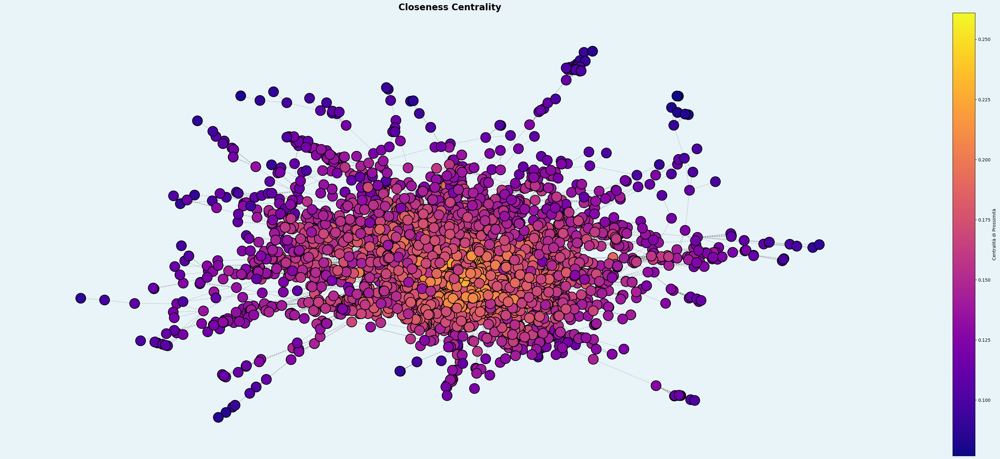

In [72]:

# Calcolo della centralità di prossimità
closeness_centrality = nx.closeness_centrality(graph)

# Plot del grafo con la centralità di prossimità
pos = nx.spring_layout(graph)
draw(graph, pos, closeness_centrality, 'Closeness Centrality')

In [73]:
def draw(graph, pos, measures, measure_name):
    plt.figure(figsize=(45, 18), facecolor='#e8f4f8')
    
    # Disegna i nodi con colorazioni basate sulle misure
    nodes = nx.draw_networkx_nodes(graph, pos, node_size=500, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys(), 
                                   edgecolors='k', linewidths=1.5)
    
    # Disegna gli archi con stile personalizzato
    edges = nx.draw_networkx_edges(graph, pos, edge_color='gray', style='dashed', alpha=0.5)
    
    
    # Aggiungi la barra dei colori e il titolo
    plt.colorbar(nodes, label='Betweenness Centrality')
    plt.title(measure_name, fontsize=20, fontweight='bold')
    
    plt.axis('off')
    plt.show()

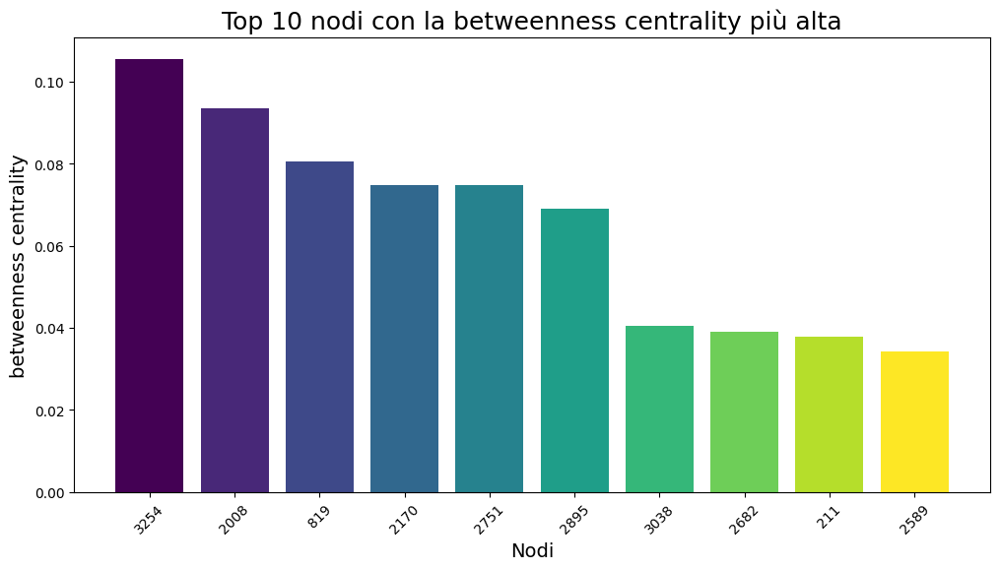

In [74]:


graph_betweenness = nx.betweenness_centrality(graph)


betweenness_df = pd.DataFrame(graph_betweenness.items(), columns=['nodes', 'betweenness_centrality'])

# Selezione dei top 10 nodi 
top_10_betweenness = betweenness_df.sort_values(by='betweenness_centrality', ascending=False).head(10)

# Visualizzazione dei top 10 nodi
plt.figure(figsize=(12, 6))
colors = plt.cm.viridis(np.linspace(0, 1, 10))  # Creazione di una lista di colori unici per i top 10 nodi
bars = plt.bar(top_10_betweenness['nodes'].astype(str), top_10_betweenness['betweenness_centrality'], color=colors)
plt.xlabel('Nodi', fontsize=14)
plt.ylabel('betweenness centrality', fontsize=14)
plt.title('Top 10 nodi con la betweenness centrality più alta', fontsize=18)
plt.xticks(rotation=45)

plt.show()

Nodo con la centralità di prossimità più alta: 3254, Valore: 0.10544488181477074


<BarContainer object of 3892 artists>

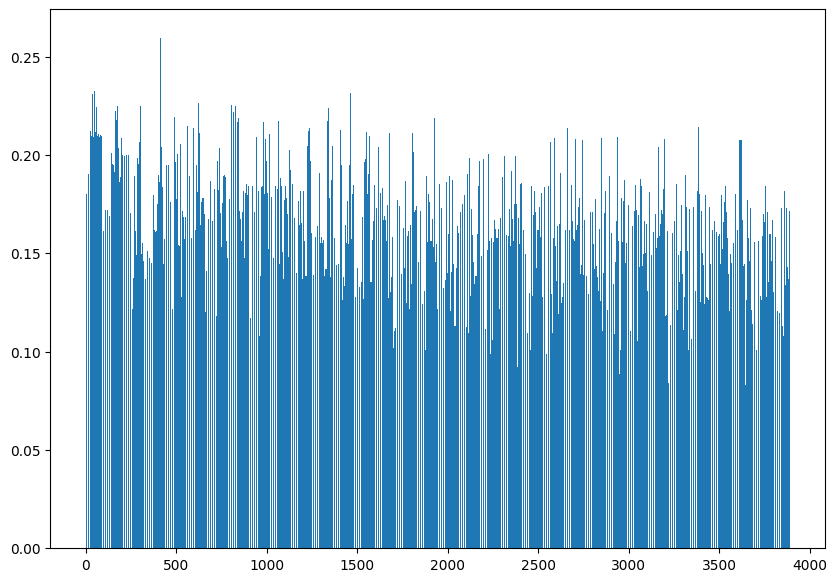

In [75]:

graph_betweennesss = nx.betweenness_centrality(graph)

# Trova il nodo con la centralità di prossimità più alta e il suo valore
max_node, max_betweenness = max(graph_betweenness.items(), key=lambda x: x[1])
print(f"Nodo con la centralità di prossimità più alta: {max_node}, Valore: {max_betweenness}")

# Plot della distribuzione di tutte le centralità di prossimità
x_betweenness = graph_betweenness.values()


y_betweenness = graph_closeness.values()
plt.figure(figsize=(10,7))
plt.bar(range(len(x_betweenness)), y_betweenness)

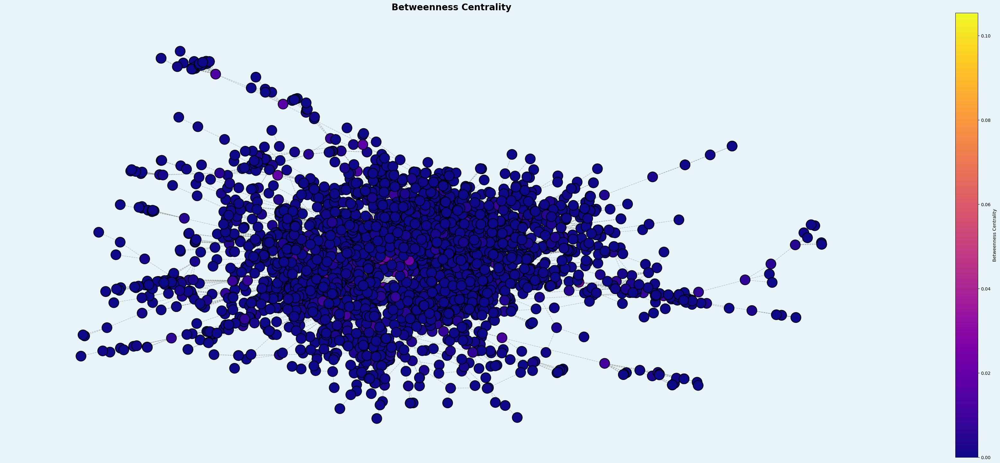

In [76]:

# Calcolo della centralità di prossimità
betweenness_centrality = nx.betweenness_centrality(graph)

# Plot del grafo con la centralità di prossimità
pos = nx.spring_layout(graph)
draw(graph, pos,betweenness_centrality, 'Betweenness Centrality')

In [77]:
def draw(graph, pos, measures, measure_name):
    plt.figure(figsize=(45, 18), facecolor='#e8f4f8')
    
    # Disegna i nodi con colorazioni basate sulle misure
    nodes = nx.draw_networkx_nodes(graph, pos, node_size=500, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys(), 
                                   edgecolors='k', linewidths=1.5)
    
    # Disegna gli archi con stile personalizzato
    edges = nx.draw_networkx_edges(graph, pos, edge_color='gray', style='dashed', alpha=0.5)
    
    
    # Aggiungi la barra dei colori e il titolo
    plt.colorbar(nodes, label='Eigenvector Centrality')
    plt.title(measure_name, fontsize=20, fontweight='bold')
    
    plt.axis('off')
    plt.show()

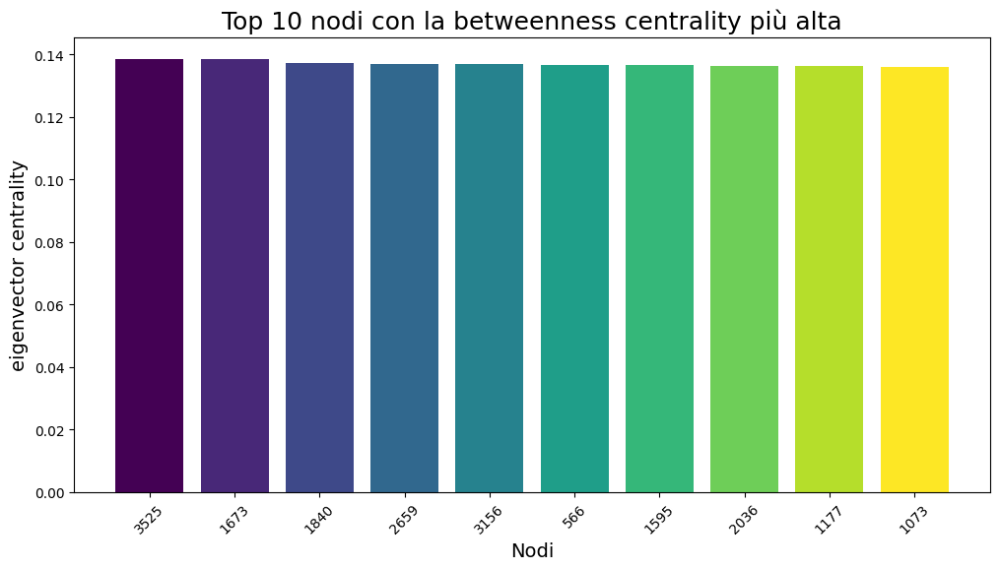

In [78]:

graph_eigenvector = nx.eigenvector_centrality(graph)


eigenvector_df = pd.DataFrame(graph_eigenvector.items(), columns=['nodes', 'eigenvector_centrality'])

# Selezione dei top 10 nodi 
top_10_eigenvector = eigenvector_df.sort_values(by='eigenvector_centrality', ascending=False).head(10)

# Visualizzazione dei top 10 nodi
plt.figure(figsize=(12, 6))
colors = plt.cm.viridis(np.linspace(0, 1, 10))  # Creazione di una lista di colori unici per i top 10 nodi
bars = plt.bar(top_10_eigenvector['nodes'].astype(str), top_10_eigenvector['eigenvector_centrality'], color=colors)
plt.xlabel('Nodi', fontsize=14)
plt.ylabel('eigenvector centrality', fontsize=14)
plt.title('Top 10 nodi con la betweenness centrality più alta', fontsize=18)
plt.xticks(rotation=45)

plt.show()

Nodo con la centralità di prossimità più alta: 3525, Valore: 0.1385223216549383


<BarContainer object of 3892 artists>

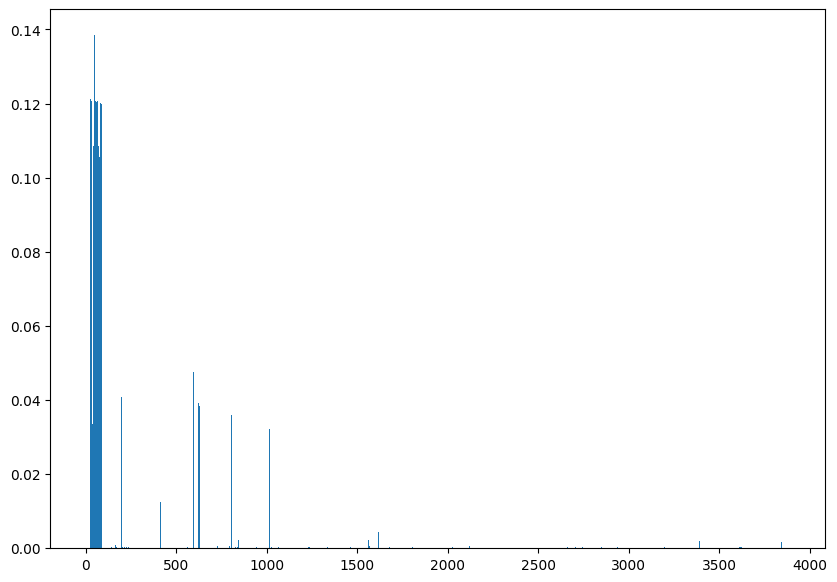

In [79]:

graph_eigenvector = nx.eigenvector_centrality(graph)

# Trova il nodo con la centralità di prossimità più alta e il suo valore
max_node, max_eigenvector = max(graph_eigenvector.items(), key=lambda x: x[1])
print(f"Nodo con la centralità di prossimità più alta: {max_node}, Valore: {max_eigenvector}")

# Plot della distribuzione di tutte le centralità di prossimità
x_eigenvector = graph_eigenvector.values()
y_eigenvector = graph_eigenvector.values()


plt.figure(figsize=(10,7))
plt.bar(range(len(x_eigenvector)), y_eigenvector)

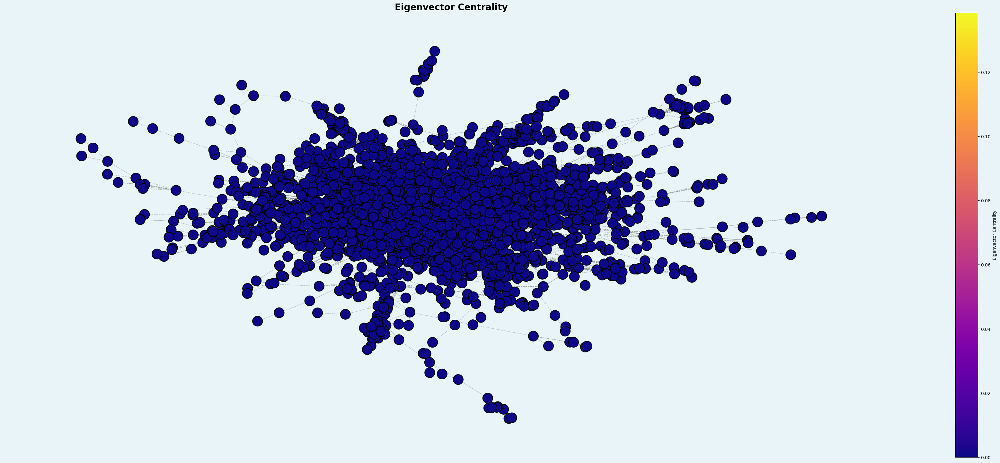

In [80]:

eigenvector_centrality = nx.eigenvector_centrality(graph)

# Plot del grafo con la centralità di prossimità
pos = nx.spring_layout(graph)
draw(graph, pos,eigenvector_centrality, 'Eigenvector Centrality')

In [81]:
def cli_graph(graph):  
  fig = plt.figure(figsize=(10,8))
  nx.draw(graph, alpha = 0.8, node_color = '#22B015', 
          with_labels= True, font_size = 16, 
          width = 0.2, edge_color ='black')
  fig.suptitle(f'Clique costituita da {len(graph)} nodi e {len(graph.edges)} archi', fontsize=20)
  plt.show()

In [82]:
cliques = []
i = 1
for clique in nx.find_cliques(graph):
  cliques.append(graph.subgraph(clique))
print((f'Il grafo presenta in totale {len(cliques)} Clique'))

Il grafo presenta in totale 6355 Clique


Text(0.5, 1.0, 'Distribuzioni delle dimensioni delle Clique')

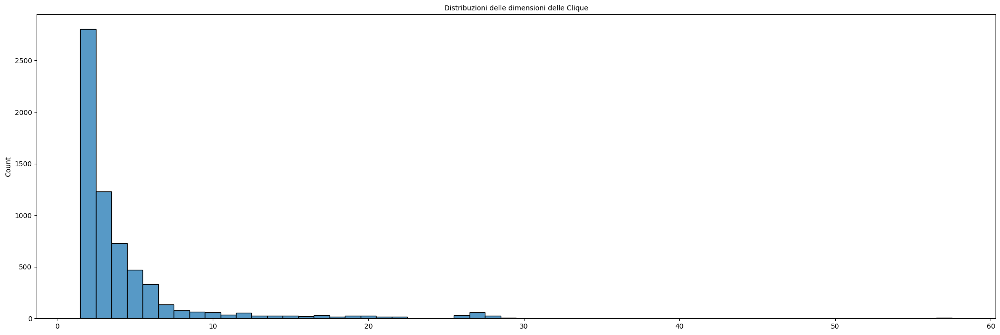

In [83]:
par_distr = []
for cl in cliques:
  par_distr.append(len(cl))
plt.figure(figsize=(25,8))
sns.histplot(par_distr, discrete=True)
plt.title("Distribuzioni delle dimensioni delle Clique", fontsize=10)

In [84]:
cliq_fltr = [clq for clq in cliques if len(clq) >= 25]
print(f'Clique with n. nodes > 18: {len(cliq_fltr)}')
G_1 = cliq_fltr[0]
G_2 = cliq_fltr[1]
G_3 = cliq_fltr[2]
G_4 = cliq_fltr[3]
print(G_1)
print(G_2)
print(G_3)
print(G_4)

Clique with n. nodes > 18: 132
Graph with 56 nodes and 1540 edges
Graph with 57 nodes and 1596 edges
Graph with 57 nodes and 1596 edges
Graph with 57 nodes and 1596 edges


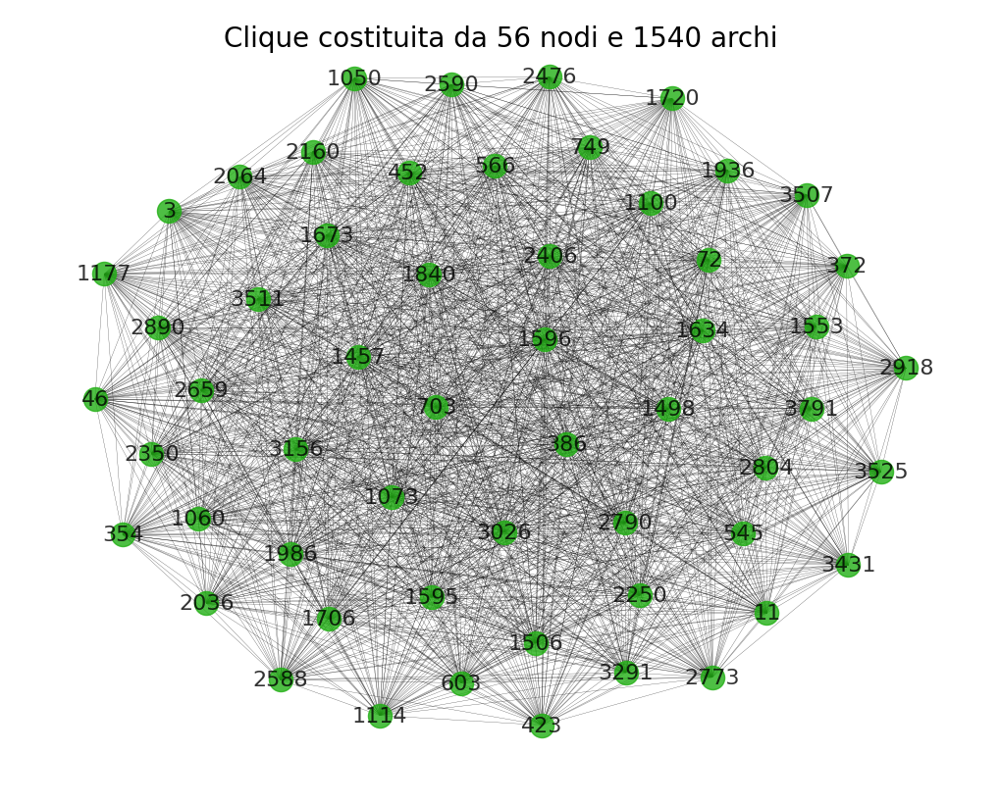

In [85]:
cli_graph(G_1)

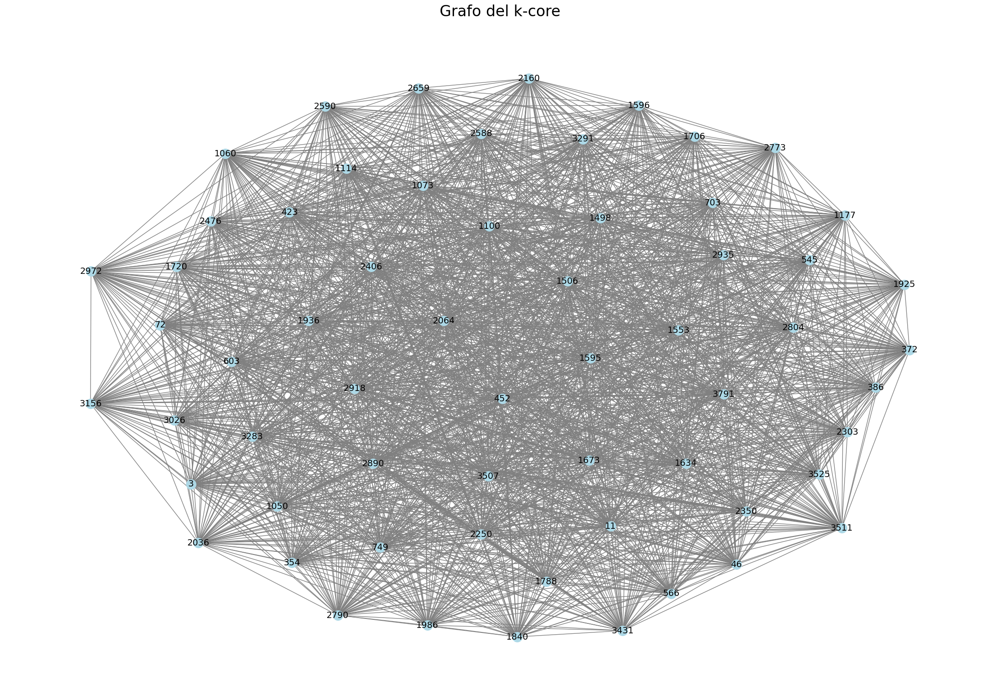

In [86]:
import networkx as nx

# Supponiamo che il grafo 'G' sia già definito

# Rimuovi gli auto-loop dal grafo
graph.remove_edges_from(nx.selfloop_edges(graph))

# Ora possiamo calcolare il k-core
kcore = nx.k_core(graph)

# Visualizza il grafo del k-core
import matplotlib.pyplot as plt

plt.figure(figsize=(22, 15))
nx.draw(kcore, with_labels=True, node_color='lightblue', edge_color='gray', node_size=240, font_size=14)
plt.title("Grafo del k-core", fontsize=24)
plt.show()


Nodes:  127
Edges:  274


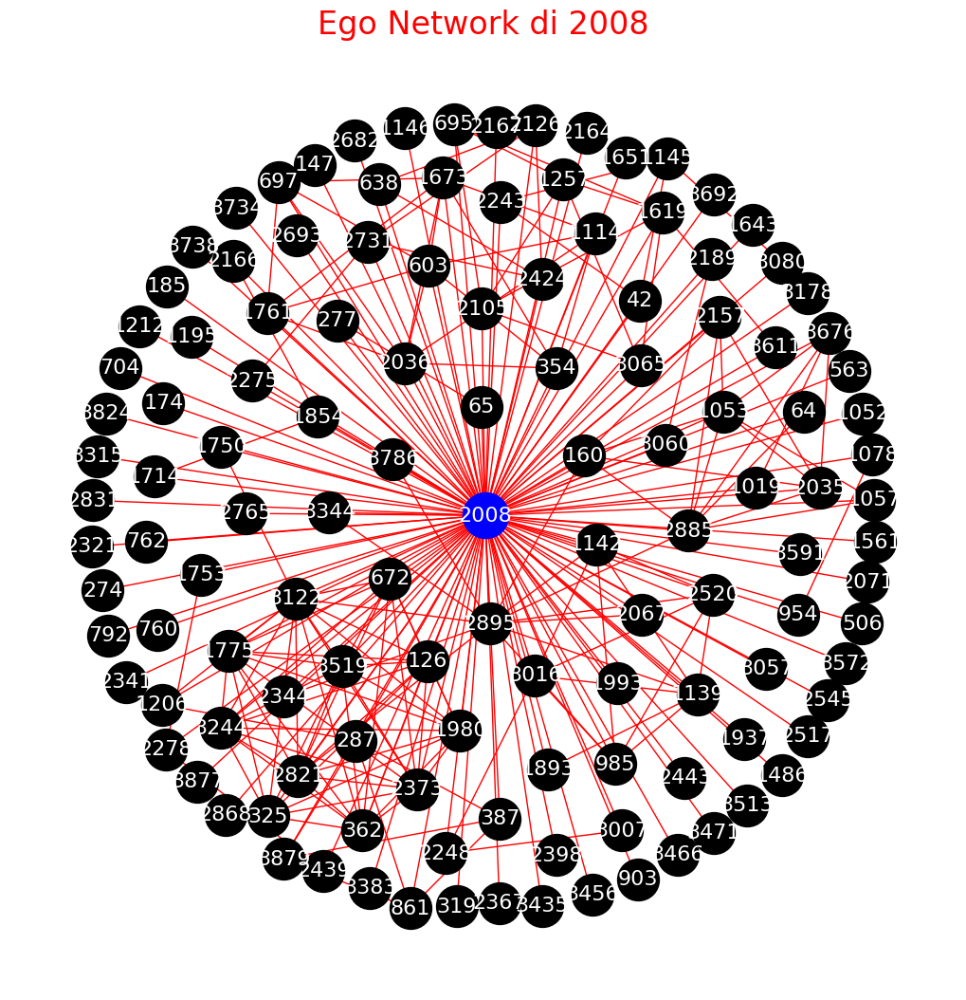

In [125]:
def ego_net_top5(ego):

    if ego in graph.nodes:
        ego_network = nx.ego_graph(graph, ego)
        print("Nodes: ", len(ego_network.nodes))
        print("Edges: ", len(ego_network.edges))
        pos = nx.kamada_kawai_layout(ego_network)  # Layout Kamada-Kawai
        
        plt.figure(figsize=(10, 10))
        nx.draw(ego_network, pos, node_color='black', node_size=1000, 
                with_labels=True, edge_color='red', font_size=16, font_color='white')
        # Disegna il nodo chiamato (ego) in un colore diverso
        nx.draw_networkx_nodes(ego_network, pos, nodelist=[ego], node_color='blue', node_size=1200)
        plt.title(f"Ego Network di {ego}", fontsize=24, color='red')
        plt.gca().set_facecolor('black')
        plt.show()
    else:
        print(f"Nodo {ego} non trovato nel grafo.")

# Usa la funzione per visualizzare una ego network
ego_net_top5(2008)


Nodes:  127
Edges:  270


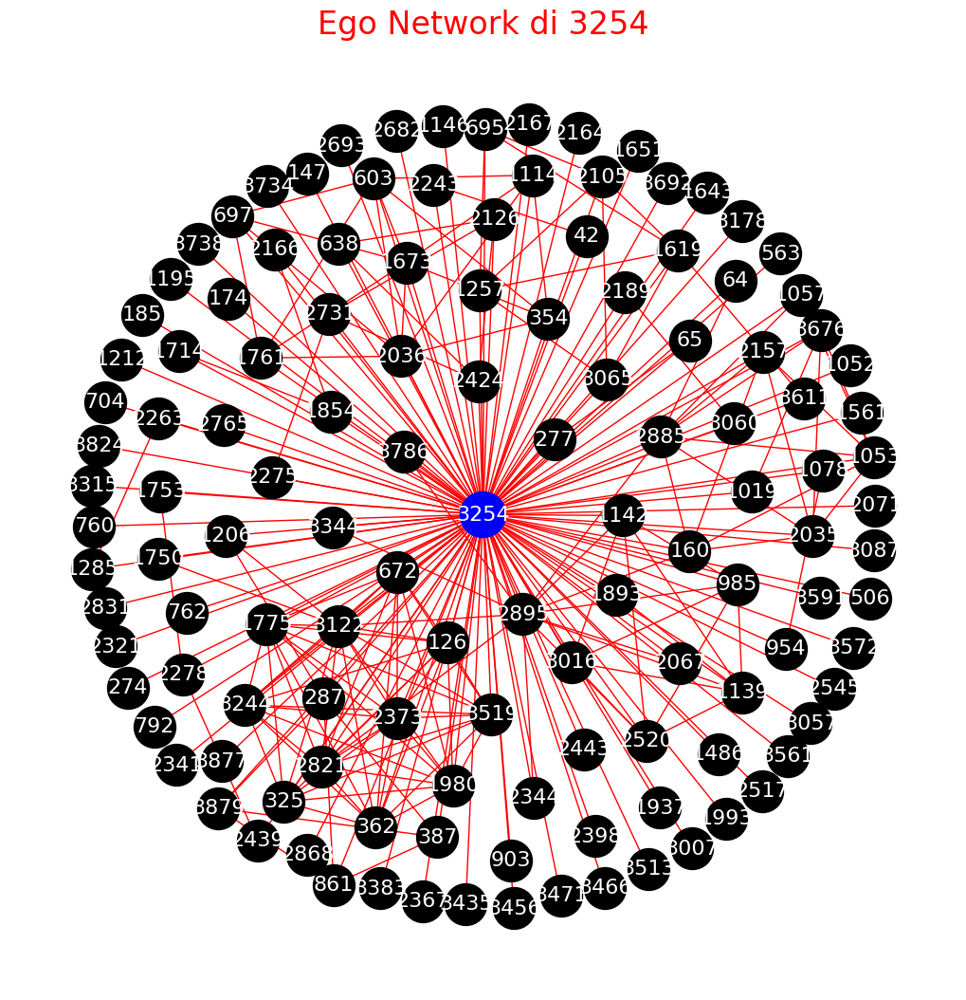

In [126]:
ego_net_top5(3254)

Nodes:  59
Edges:  297


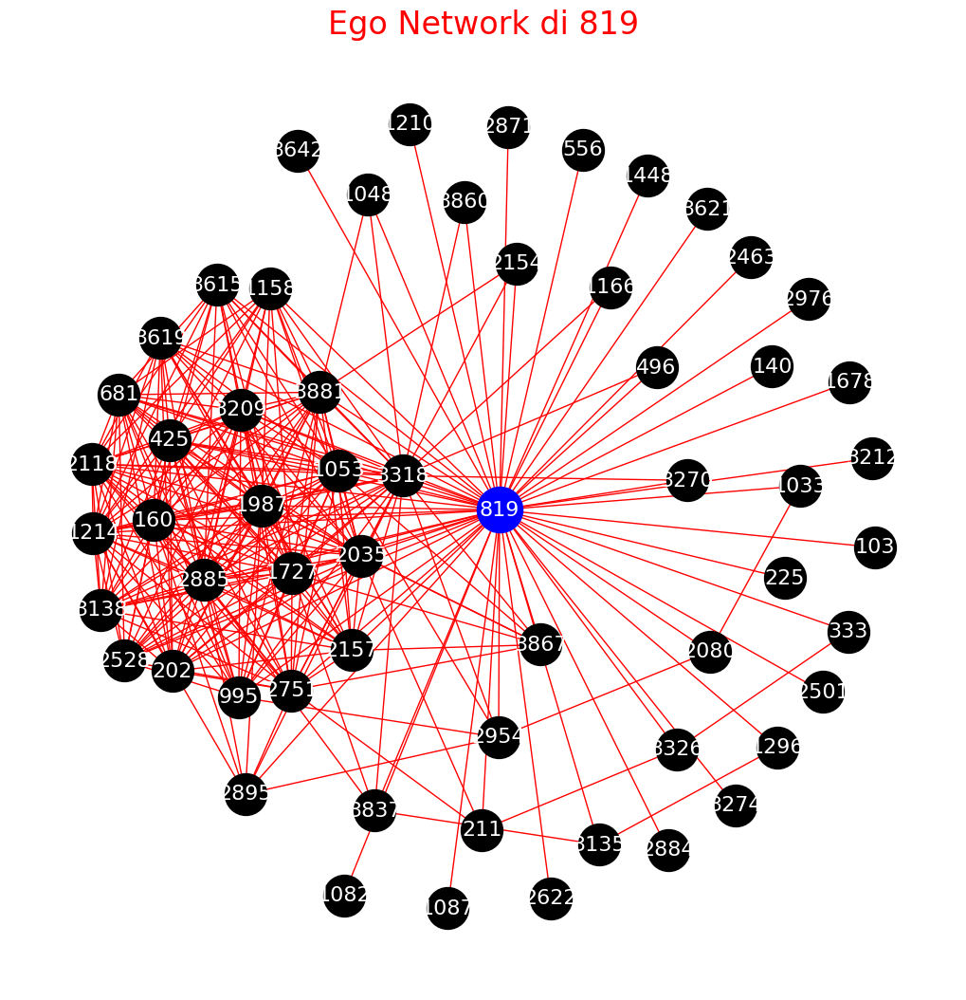

In [127]:
ego_net_top5(819)

Nodes:  109
Edges:  2687


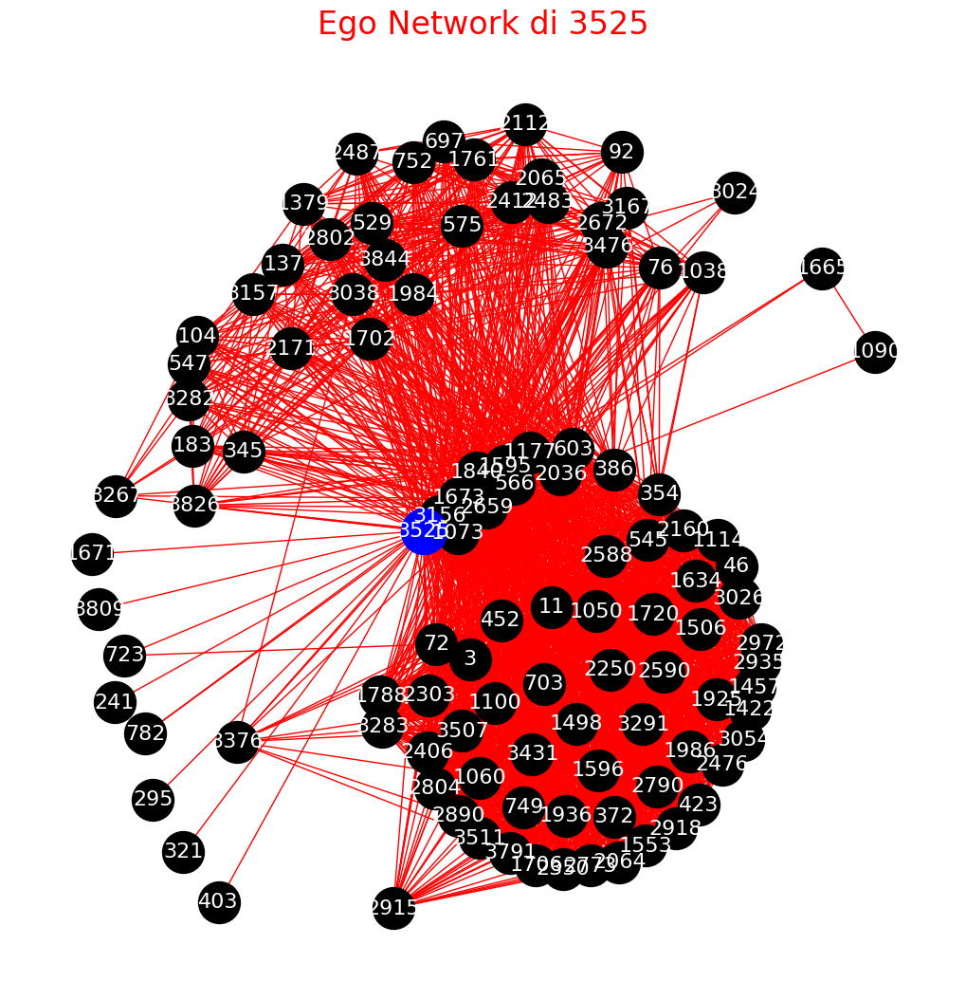

In [128]:
ego_net_top5(3525)